### 1. **Exam Scheduling as a Graph Coloring Problem**
The core challenge of exam scheduling lies in avoiding overlaps — ensuring that no student has two exams scheduled at the same time.  
To model this problem, each course is represented as a node in a graph.

If a student is enrolled in multiple courses, we draw an edge between the nodes of those courses to indicate a potential conflict.

Therefore, two connected courses cannot be assigned to the same time slot. This is essentially what **graph coloring** addresses: by assigning colors (which represent time slots) to nodes, the goal is to ensure that no two connected nodes share the same color.

In this context, each color corresponds to a distinct exam period, and the objective is to use as few colors as possible, which means reducing the number of exam periods and avoiding conflicts for students.

### 2. **Graph Coloring Algorithms Used in the Project**

In this project, two graph coloring algorithms were applied to solve the exam scheduling problem: **DSATUR (Saturation Largest First)** and **Random Sequential**. Below is a breakdown of how each algorithm works and their role in the scheduling process:

- **Algorithm 1: DSATUR (Saturation Largest First)**
  - **How it operates:**
    - The **DSATUR** algorithm selects nodes based on the number of different colors already assigned to their neighbors (referred to as saturation).
    - It prioritizes nodes that have the highest saturation because those nodes are more likely to cause conflicts if not handled properly. By focusing on these nodes first, the algorithm aims to allocate colors more efficiently and avoid unnecessary overlaps.
    - This results in fewer exam periods, as it more intelligently handles the constraints imposed by student enrollments.
  - **Advantages:**
    - **DSATUR** is particularly well-suited for complex graphs like exam schedules, as it tends to minimize the total number of periods required for exams.
    - It’s a smart choice for optimizing the scheduling process, providing better results than simpler approaches.

- **Algorithm 2: Random Sequential**
  - **How it works:**
    - The **Random Sequential** approach randomly selects nodes and assigns them the first available color.
    - This method does not consider the saturation of neighboring nodes, which may lead to inefficiencies as connected nodes might end up with the same color.
  - **Advantages and Disadvantages:**
    - While **Random Sequential** is easy to implement and works quickly, it often results in a higher number of exam periods since it doesn’t prioritize avoiding conflicts as effectively as **DSATUR**.
    - This algorithm is often used for testing purposes or as a baseline for comparing the performance of more advanced techniques.

#### **Summary:**
- **DSATUR** is the most effective algorithm for minimizing the number of exam periods because it carefully selects nodes based on their saturation, ensuring that conflicts are minimized and fewer periods are needed.
- On the other hand, **Random Sequential** is faster but less efficient, leading to more exam periods. It’s primarily used for testing and comparison rather than for optimal scheduling.


In [29]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm # الوان
import matplotlib.patches as mpatches #legend
import arabic_reshaper #ترتيب الحروف 
from bidi.algorithm import get_display #عكس النص العربي عشان يبان عادي
from collections import Counter # بيحسب عدد الكورسات 
import random 

In [15]:
file_path ="C:\\Users\\Hello\\Desktop\\toolss.xlsx"
sheets = pd.read_excel(file_path, sheet_name=None)
print("Sheet names:", sheets.keys())
print("columns",df.columns)

Sheet names: dict_keys(['علوم طبية ', 'صيدلة وطب اسنان', 'العلوم الادارية', 'الهندسة', 'حاسب الي'])
columns Index(['م', 'رقم الطالب', 'اسم الطالب', 'التخصص', 'رقم المقرر', 'اسم المقرر',
       'رمز المقرر', 'رقم الشعبة'],
      dtype='object')


In [17]:
for sheet_name, df in sheets.items():
    print(f" :{sheet_name} ")
    if 'اسم المقرر' in df.columns:
        course_col = 'اسم المقرر'
    else:
        print("not found columns")
        continue
    
    unique_courses = df[course_col].dropna().unique()
    print(f"Number of Courses {len(unique_courses)}")

 :علوم طبية  
Number of Courses 103
 :صيدلة وطب اسنان 
Number of Courses 96
 :العلوم الادارية 
Number of Courses 166
 :الهندسة 
Number of Courses 71
 :حاسب الي 
Number of Courses 87



 (علوم طبية )
Courses(Nodes): 103
relation(Edges): 780


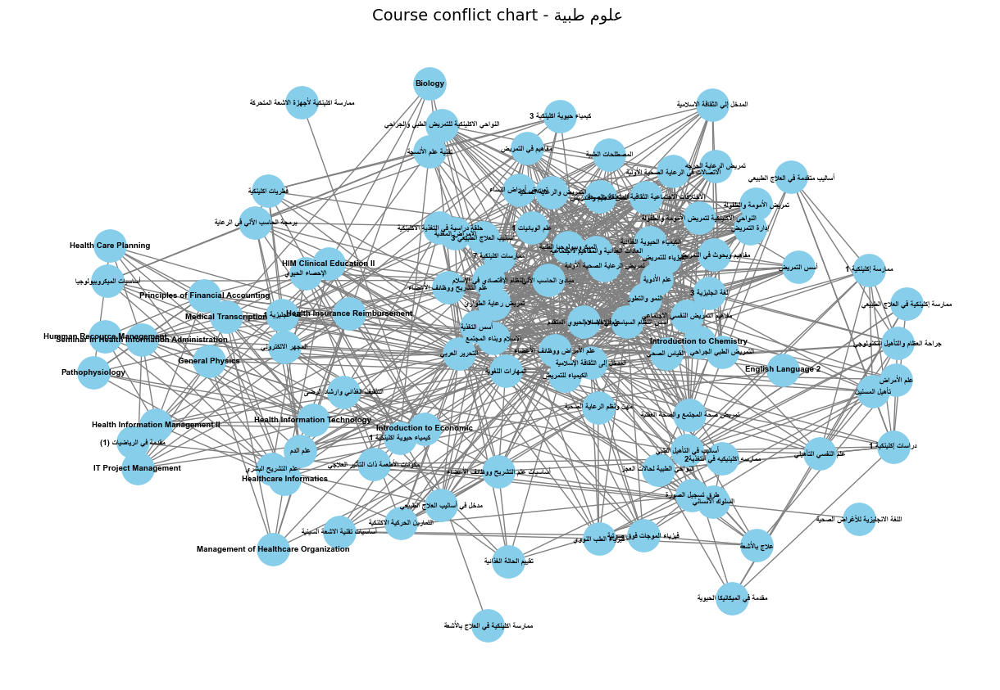


 (صيدلة وطب اسنان)
Courses(Nodes): 96
relation(Edges): 1323


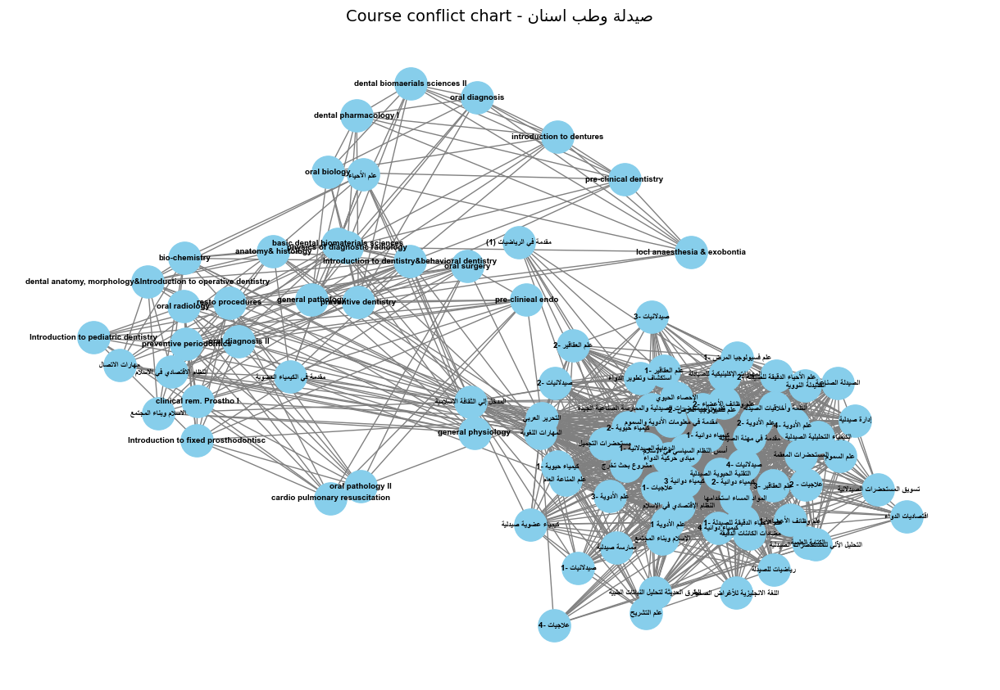


 (العلوم الادارية)
Courses(Nodes): 165
relation(Edges): 1780


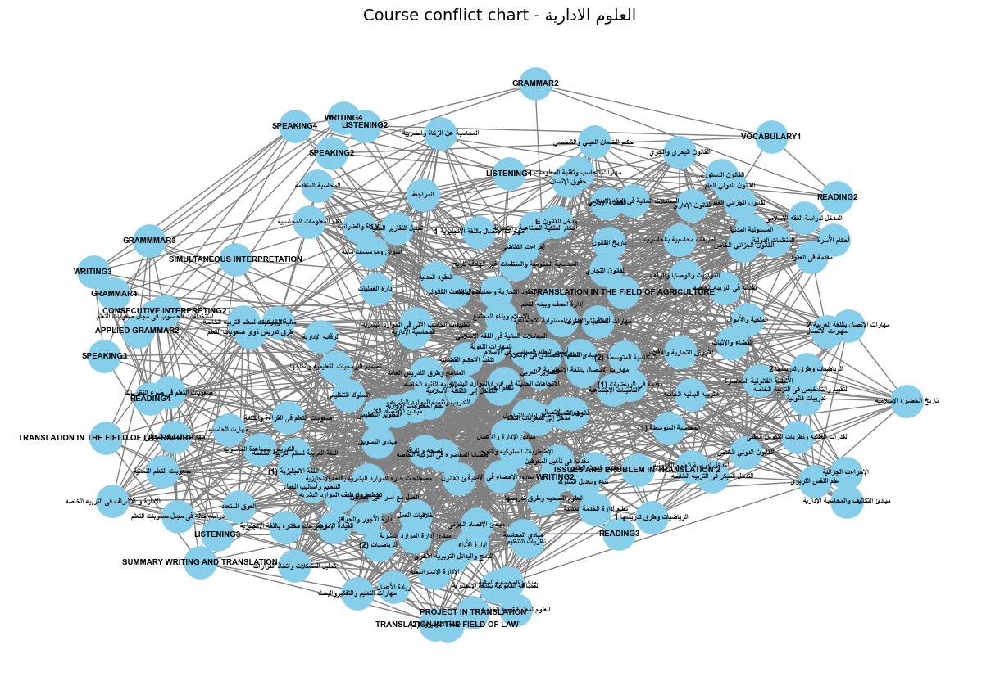


 (الهندسة)
Courses(Nodes): 71
relation(Edges): 884


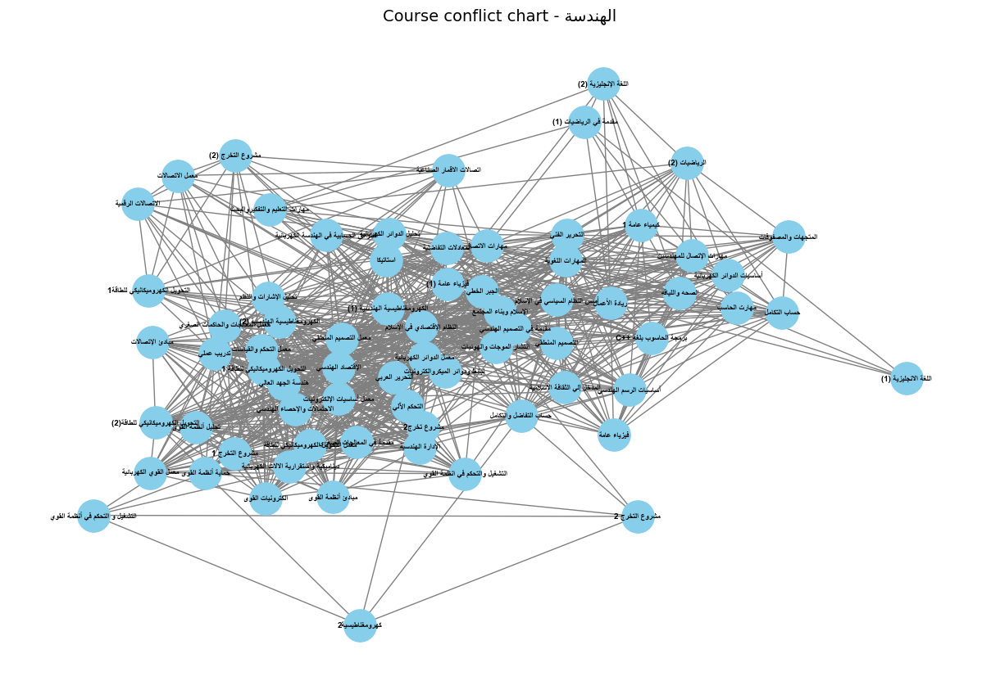


 (حاسب الي)
Courses(Nodes): 87
relation(Edges): 662


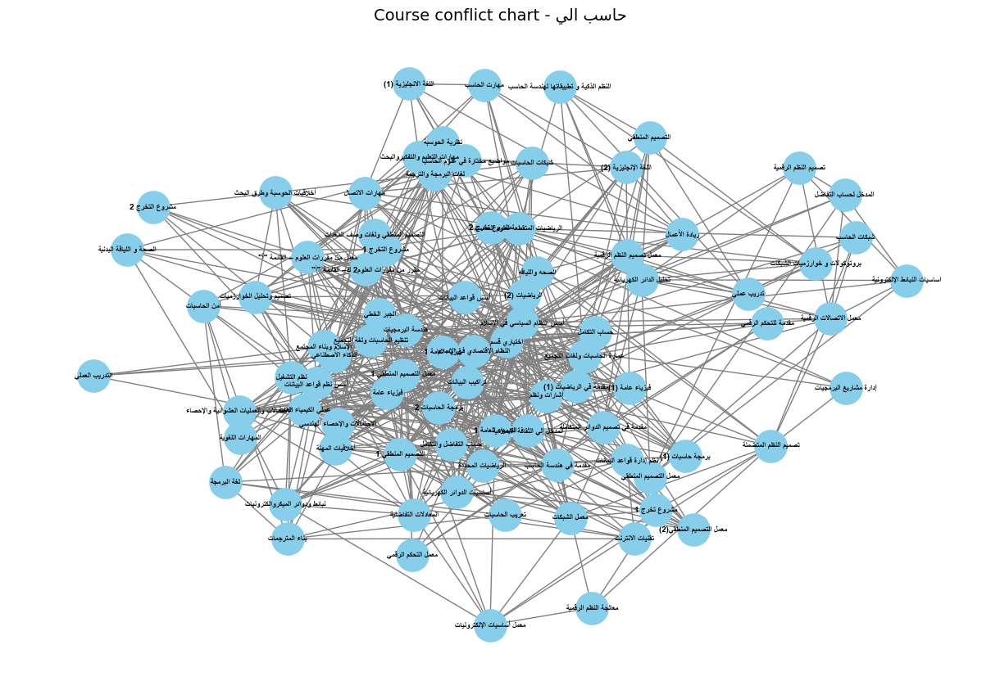

In [19]:
for sheet_name, df in sheets.items():
    print(f"\n ({sheet_name})")

    if 'اسم المقرر' in df.columns:
        course_col = 'اسم المقرر'
    else:
        print("not found columns,skip.")
        continue

    student_courses = {}
    for _, row in df.iterrows():
        student_id = row.iloc[1]
        course = row[course_col]
        student_courses.setdefault(student_id, set()).add(course)

    G = nx.Graph()
    for courses in student_courses.values():
        course_list = list(courses)
        for i in range(len(course_list)):
            for j in range(i + 1, len(course_list)):
                G.add_edge(course_list[i], course_list[j])

    print(f"Courses(Nodes): {G.number_of_nodes()}")
    print(f"relation(Edges): {G.number_of_edges()}")

    labels = {}
    for node in G.nodes(): #بتجهز الlabels عشان تتكتب بالعربي 
        reshaped = arabic_reshaper.reshape(str(node))
        label = get_display(reshaped)
        labels[node] = label

    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.0, seed=42)  # توسيع المسافات
    nx.draw(
        G,
        pos,
        labels=labels,
        with_labels=True,
        node_color='skyblue',
        node_size=800,
        font_size=7,
        font_weight='bold',
        edge_color='gray',
        font_family='Arial'
    )
    
    reshaped_title = arabic_reshaper.reshape(f"Course conflict chart - {sheet_name}")
    bidi_title = get_display(reshaped_title)
    plt.title(bidi_title, fontsize=14)
    plt.axis('off')
    plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.1)
    plt.show()

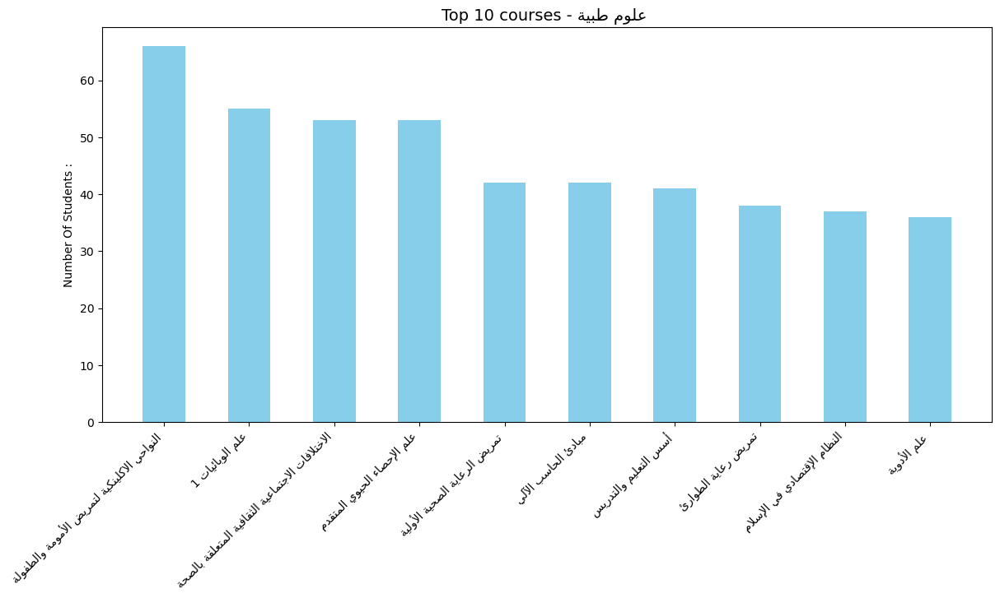

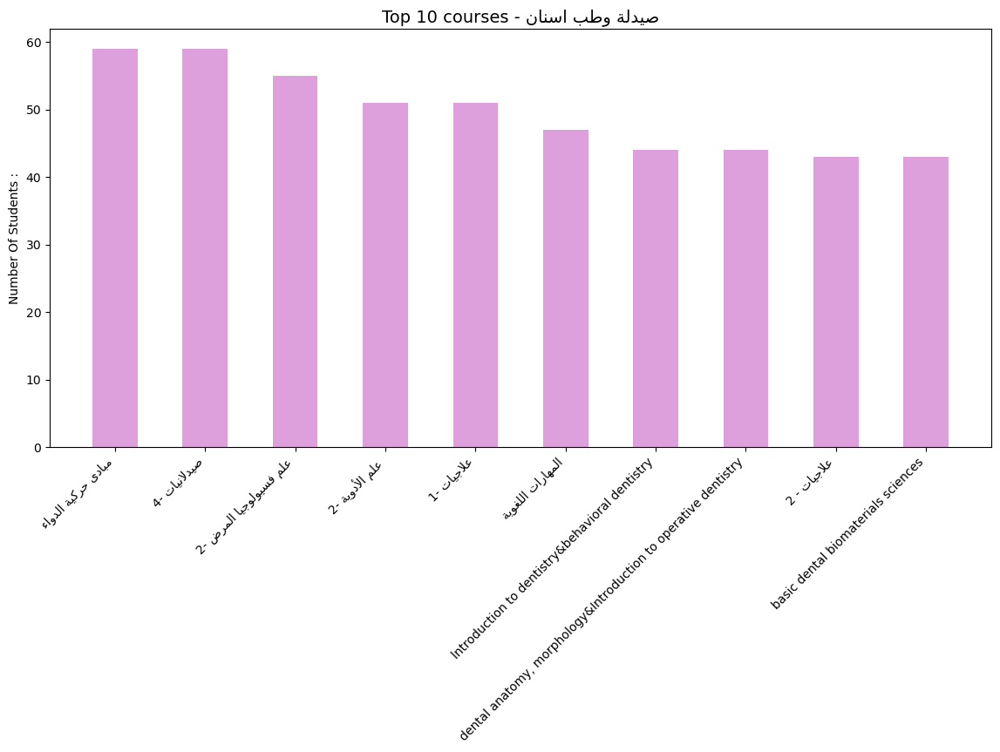

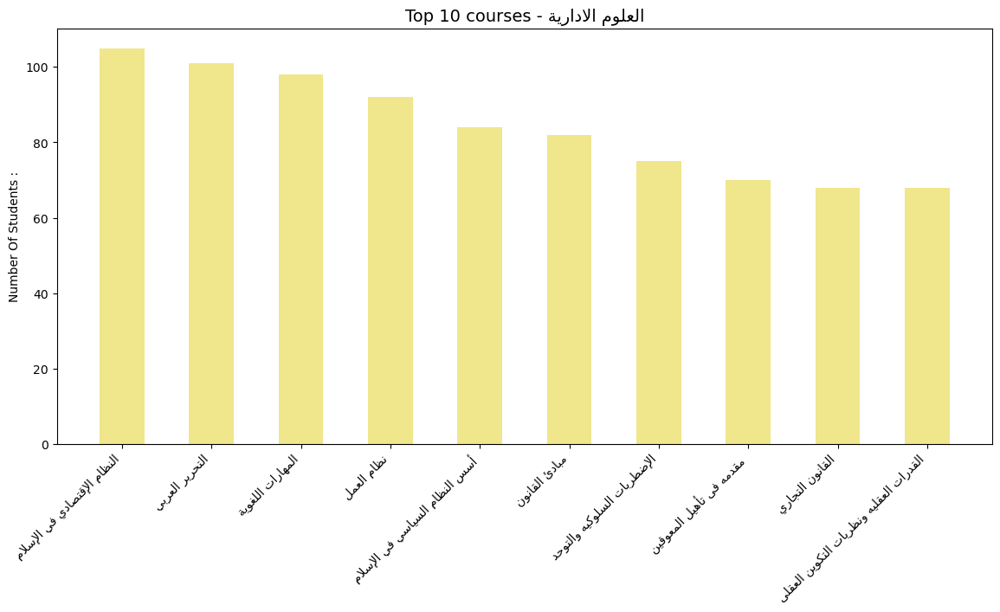

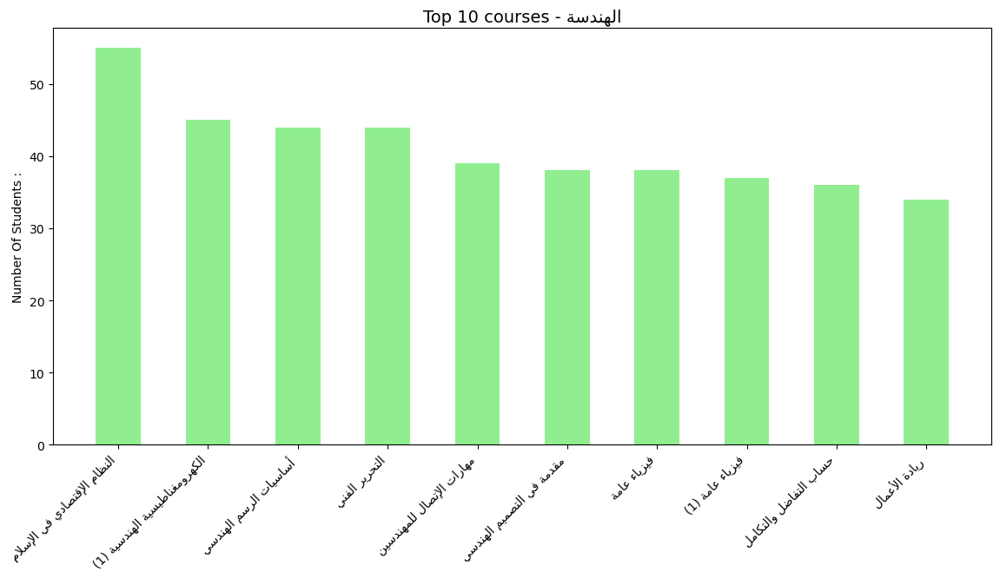

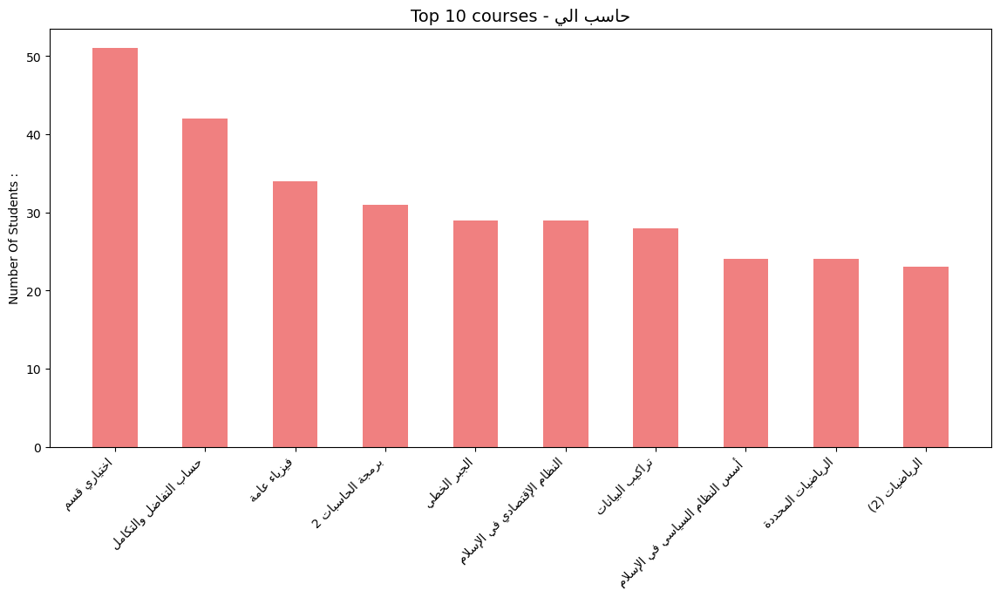

In [13]:
# اكتر 10 كورسات 
sheet_colors = ['skyblue', 'plum', 'khaki', 'lightgreen', 'lightcoral']
for i, (sheet_name, df) in enumerate(sheets.items()):
    if 'رقم الطالب' in df.columns and 'اسم المقرر' in df.columns:
        student_col = 'رقم الطالب'
        course_col = 'اسم المقرر'
    else:
        print("not found columns,skip.")
        continue
 # حساب عدد الطلاب في كل كورس وترتيبهم بدون تكرار 
    course_counts = df.groupby(course_col)[student_col].nunique().sort_values(ascending=False)

    top_courses = course_counts.head(10)
    # print(top_courses)

    #بنجهز العناوين 
    reshaped_labels = [get_display(arabic_reshaper.reshape(str(c))) for c in top_courses.index]
    reshaped_title = get_display(arabic_reshaper.reshape(f"Top 10 courses - {sheet_name}"))
    reshaped_ylabel = "Number Of Students :"

    figsize = (12, 6) 
    color = sheet_colors[i % len(sheet_colors)]

    plt.figure(figsize=figsize)
    plt.bar(reshaped_labels, top_courses.values, color=color,width=0.5)
    plt.title(reshaped_title, fontsize=14)
    plt.ylabel(reshaped_ylabel, fontsize=10)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.1)
    plt.show()

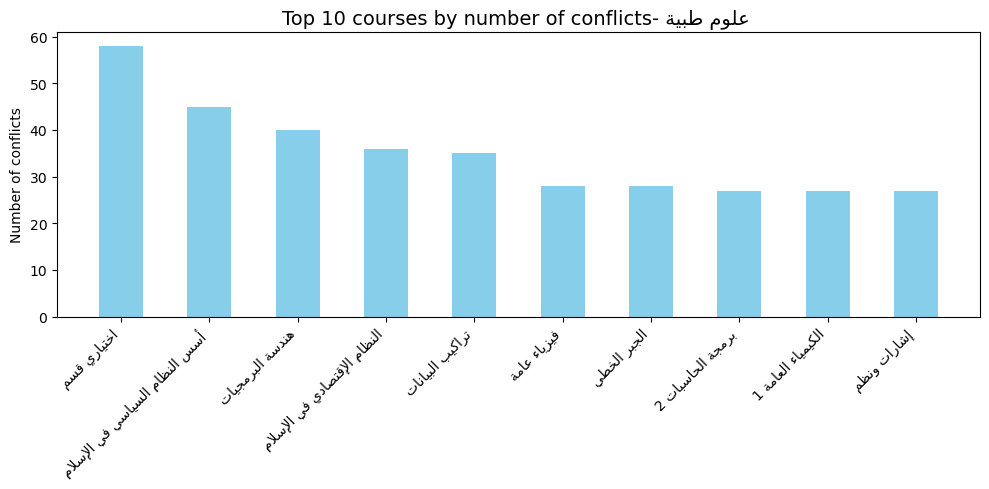

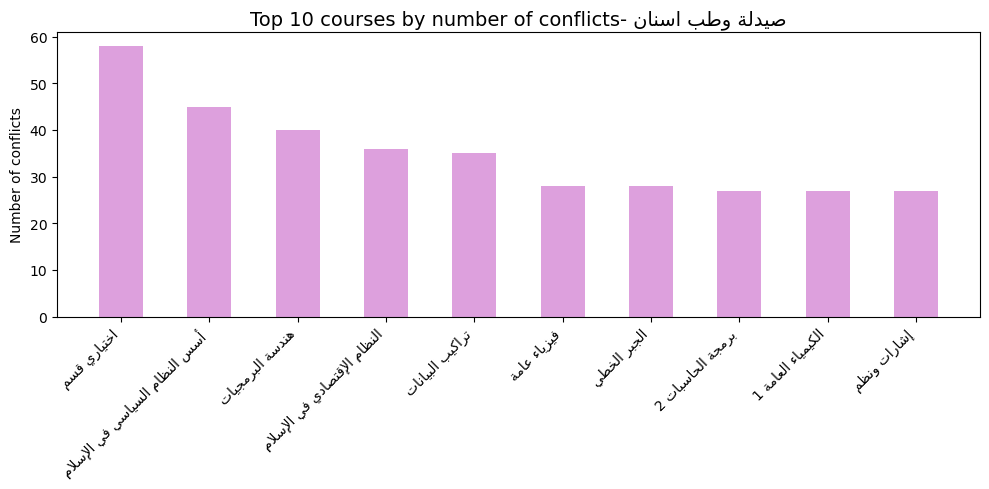

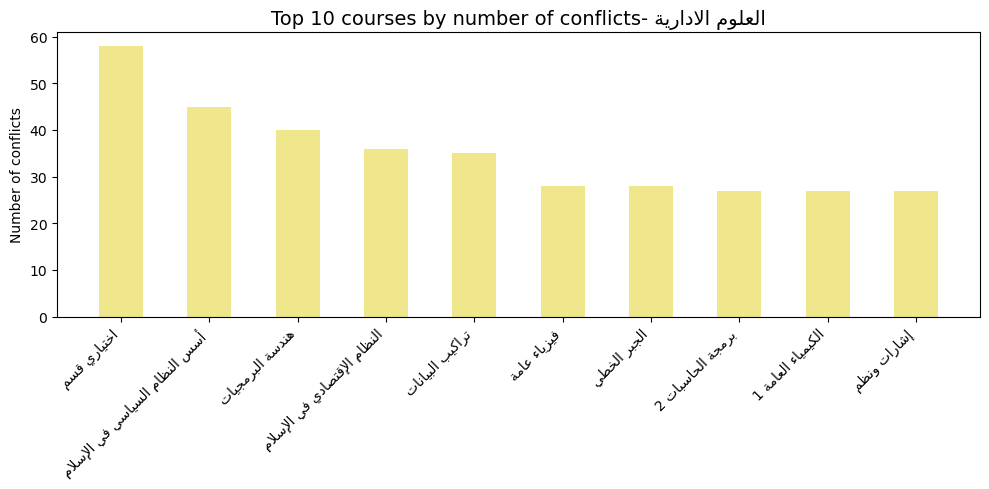

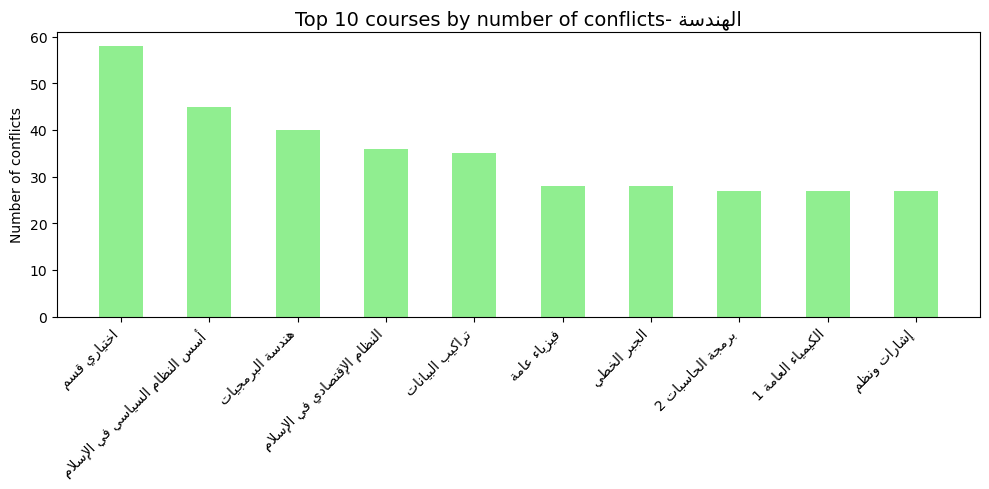

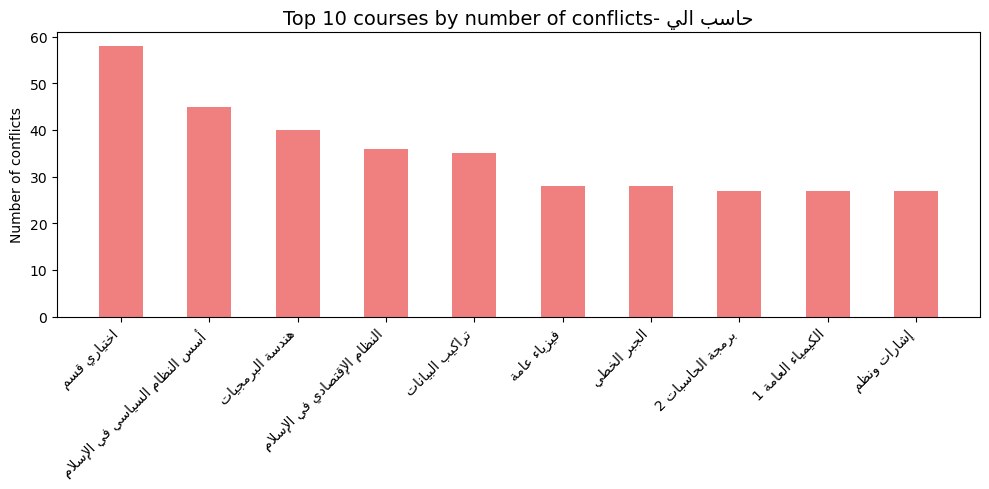

In [396]:
#تحليل لأكتر 10 كورسات فيها تعارضات في كل كلية 
sheet_colors = {  
    'علوم طبية ': 'skyblue',
    'صيدلة وطب اسنان': 'plum',
    'العلوم الادارية': 'khaki',
    'الهندسة': 'lightgreen',
    'حاسب الي': 'lightcoral'
}
for sheet_name, df in sheets.items():
    
    # بناء الجراف
    G = nx.Graph()
    for courses in student_courses.values():
        course_list = list(courses)
        for i in range(len(course_list)):
            for j in range(i + 1, len(course_list)):
                G.add_edge(course_list[i], course_list[j])


    degree_dict = dict(G.degree())
    #بنحسب درجه كل كورس يعني كام كورس تاني متعارض معاه وبناخد اول 10 
    top_degrees = dict(sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:10])

    reshaped_labels = [get_display(arabic_reshaper.reshape(str(c))) for c in top_degrees.keys()]
    reshaped_title = get_display(arabic_reshaper.reshape(f"Top 10 courses by number of conflicts- {sheet_name}"))
    reshaped_ylabel ="Number of conflicts"

    color = sheet_colors.get(sheet_name, 'gray')

    # Bar Chart
    plt.figure(figsize=(10, 5))
    plt.bar(reshaped_labels, top_degrees.values(), color=color, width=0.5)
    plt.title(reshaped_title, fontsize=14)
    plt.ylabel(reshaped_ylabel)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [398]:
#عدد الطلاب في كل مقرر داخل كل كلية 
for sheet_name, df in sheets.items():
    print(f"\nsheet: {sheet_name}")
      
    
    if 'اسم المقرر' in df.columns:
        df_cleaned = df['اسم المقرر'].dropna()

        course_counter = Counter(df_cleaned)

        students_per_course_df = pd.DataFrame(course_counter.items(), columns=["Course", "Number of Students"])
        display(students_per_course_df.sort_values("Number of Students", ascending=False).head())
    else:
        print(f"Column 'اسم المقرر' not found in {sheet_name}")


sheet: علوم طبية 


,Course,Number of Students
43,النواحي الاكلينكية لتمريض الأمومة والطفولة,66
80,علم الوبائيات 1,55
23,الاختلافات الاجتماعية الثقافية المتعلقة بالصحة,53
72,علم الإحصاء الحيوي المتقدم,53
63,تمريض الرعاية الصحية الأولية,42



sheet: صيدلة وطب اسنان


,Course,Number of Students
58,صيدلانيات -4,59
86,مبادى حركية الدواء,59
76,علم فسيولوجيا المرض -2,55
60,علاجيات -1,51
65,علم الأدوية -2,51



sheet: العلوم الادارية


,Course,Number of Students
29,اسم المقرر,285
96,النظام الإقتصادي في الإسلام,105
39,التحرير العربي,101
0,المهارات اللغوية,98
161,نظام العمل,92



sheet: الهندسة


,Course,Number of Students
29,النظام الإقتصادي في الإسلام,55
21,الكهرومغناطيسية الهندسية (1),45
32,أساسيات الرسم الهندسي,44
8,التحرير الفني,44
66,مهارات الإتصال للمهندسين,39



sheet: حاسب الي


,Course,Number of Students
0,اختياري قسم,57
47,حساب التفاضل والتكامل,42
54,فيزياء عامة,34
34,برمجة الحاسبات 2,31
23,النظام الإقتصادي في الإسلام,29


In [414]:
# frist statistics:الطالب المسجل في أكبر عدد من الكورسات
data = []
for sheet_name, df in sheets.items():
    if 'رقم الطالب' in df.columns and 'اسم المقرر' in df.columns:
        student_col = 'رقم الطالب'
        course_col = 'اسم المقرر'
    else:
        print("not found columns,skip.")
        continue
    

    df = df.dropna(subset=[student_col, course_col])
    course_counts = df.groupby(student_col)[course_col].nunique()
    top_student = course_counts.idxmax()
    top_courses = course_counts.max()

    data.append({
        "Sheet": sheet_name.strip(),
        "Top Student ID": top_student,
        "Number of Courses": top_courses
    })

df_most_loaded = pd.DataFrame(data)
display(df_most_loaded.sort_values("Number of Courses", ascending=False))


,Sheet,Top Student ID,Number of Courses
3,الهندسة,1.401311e+09,12
1,صيدلة وطب اسنان,1.201301e+09,10
2,العلوم الادارية,1.306311e+09,10
0,علوم طبية,1.105321e+09,8
4,حاسب الي,1.501301e+09,8


In [412]:
# second statistics:متوسط عدد الطلاب في كل مقرر
average_students_per_course = []

for sheet_name, df in sheets.items():
    course_col = df.columns[5]
    student_col = df.columns[1]

    course_counts = df.groupby(course_col)[student_col].nunique()
    average = course_counts.mean()

    average_students_per_course.append({
        "Sheet": sheet_name.strip(),
        "Average Students per Course": round(average)
    })

df_avg_students = pd.DataFrame(average_students_per_course)
display(df_avg_students)

,Sheet,Average Students per Course
0,علوم طبية,12
1,صيدلة وطب اسنان,26
2,العلوم الادارية,31
3,الهندسة,19
4,حاسب الي,9


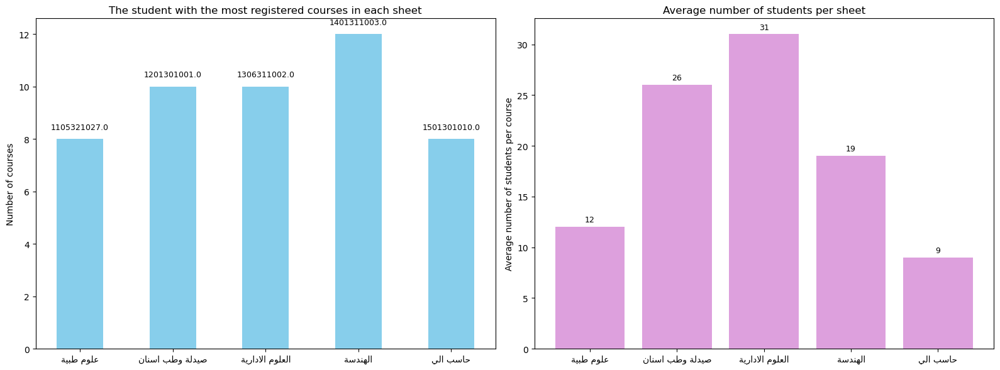

In [418]:
# visualization 
def reshape_ar(text):#للكلمات العربي
    return get_display(arabic_reshaper.reshape(text))
#تجهيز اسماؤ الشيتات
sheet_names_reshaped_1 = df_most_loaded["Sheet"].apply(reshape_ar)
sheet_names_reshaped_2 = df_avg_students["Sheet"].apply(reshape_ar)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))


bars1 = axes[0].bar(
    sheet_names_reshaped_1,
    df_most_loaded["Number of Courses"],
    color="skyblue",
    width=0.5
)
axes[0].set_ylabel("Number of courses")
axes[0].set_title("The student with the most registered courses in each sheet")

for bar, student_id in zip(bars1, df_most_loaded["Top Student ID"]):
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, height + 0.3, str(student_id),
                 ha='center', va='bottom', fontsize=9)

bars2 = axes[1].bar(
    sheet_names_reshaped_2,
    df_avg_students["Average Students per Course"],
    color="plum"
)
axes[1].set_ylabel(reshape_ar("Average number of students per course"))
axes[1].set_title(reshape_ar("Average number of students per sheet"))

for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, height + 0.3,f"{int(height)}",
                 ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


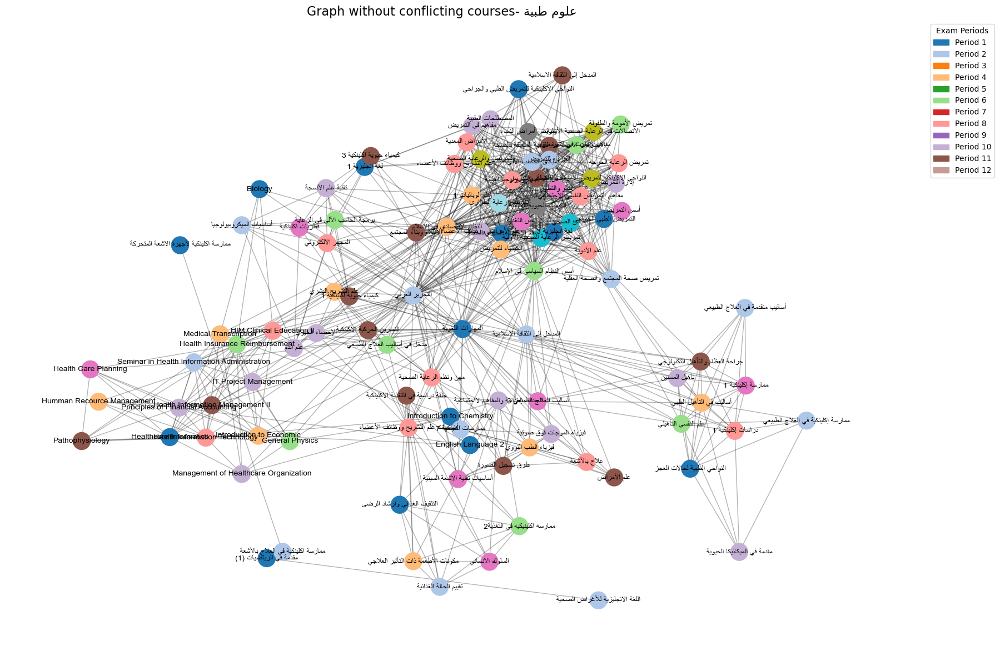

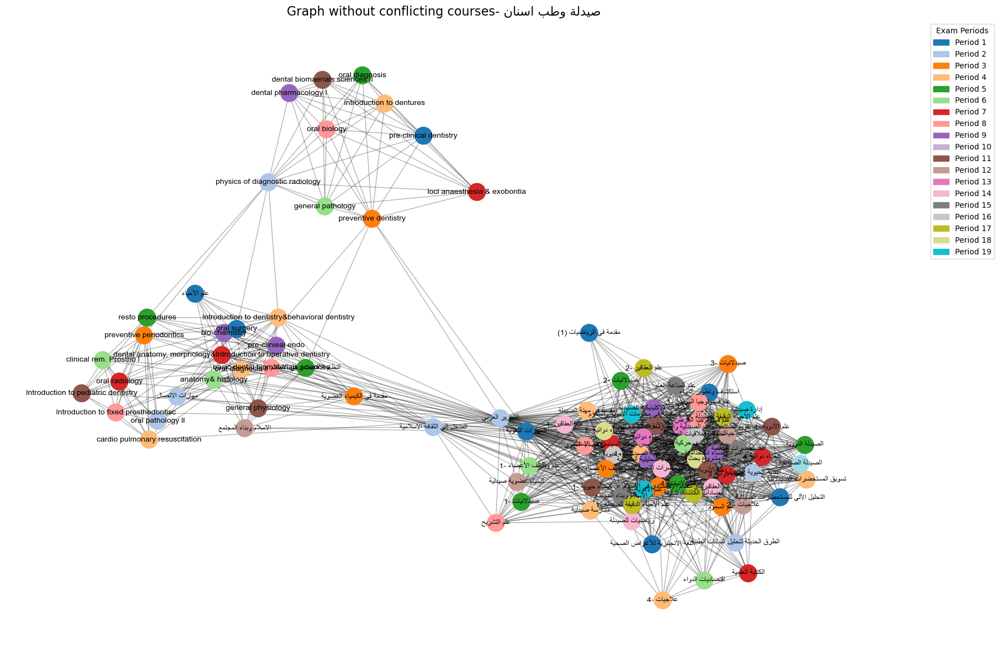

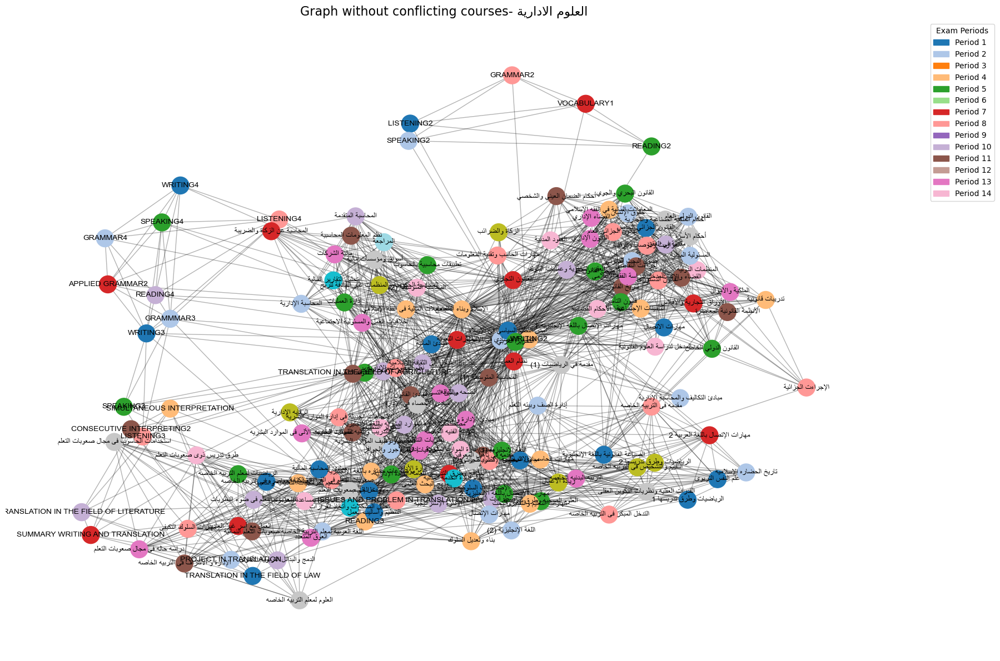

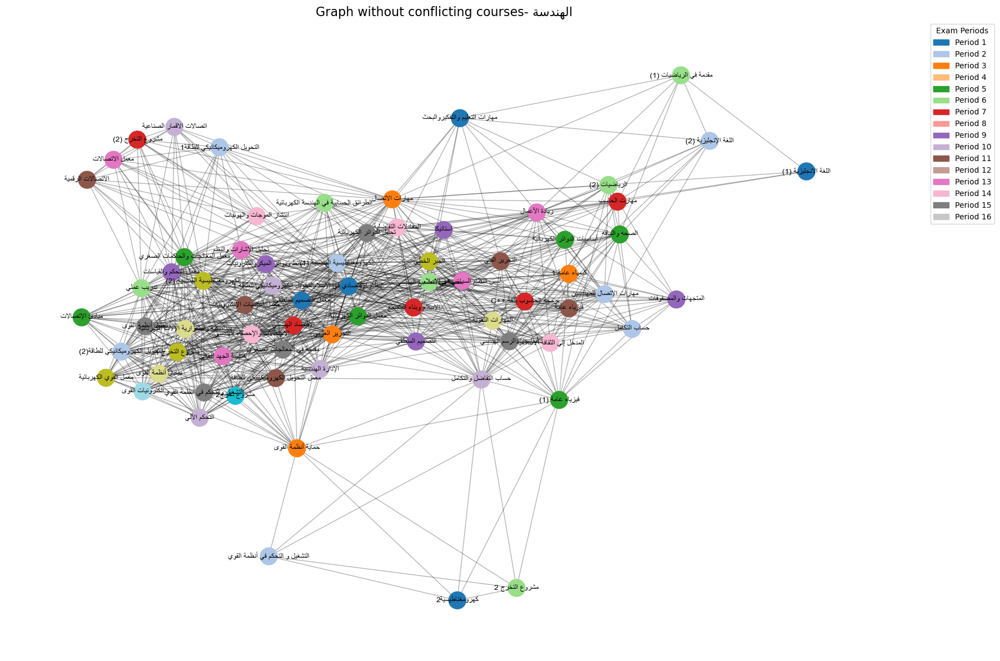

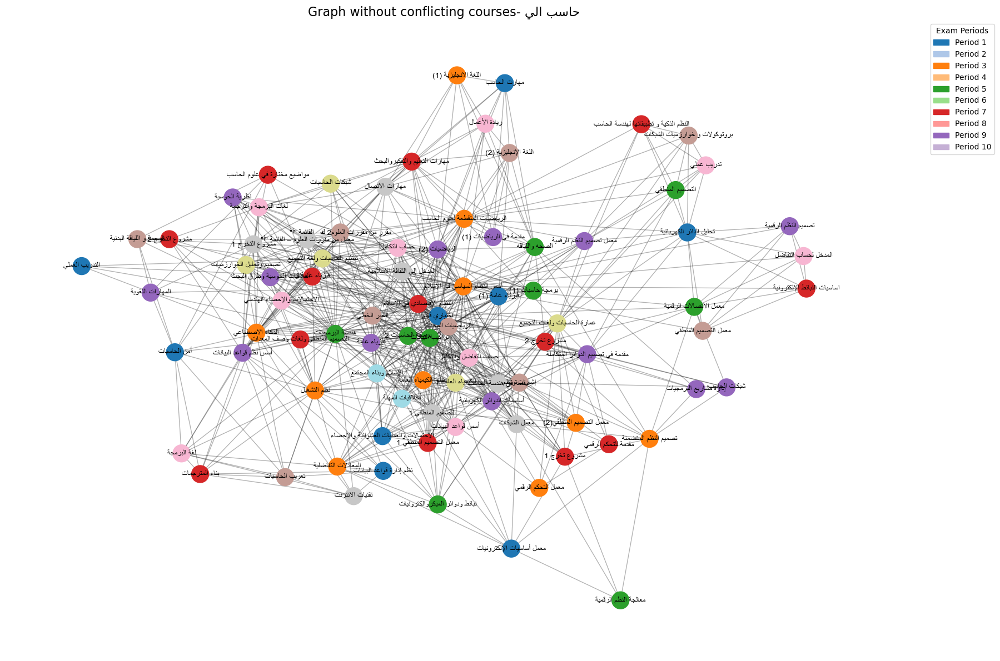

In [59]:
for sheet_name, df in sheets.items():

    student_courses = {}
    for _, row in df.iterrows():
        student_id = row[student_col]
        course = row[course_col]
        student_courses.setdefault(student_id, set()).add(course)

    G = nx.Graph()
    for courses in student_courses.values():
        course_list = list(courses)
        for i in range(len(course_list)):
            for j in range(i + 1, len(course_list)):
                G.add_edge(course_list[i], course_list[j])
                
    #كورسين بينهم edge = مش ممكن يكونوا بنفس اللون
    #كورسين بنفس اللون = مفيش تعارض بينهم

    # بتختار العقدة اللي عندها أكتر عدد من الألوان المختلفة افضل توزيع اقل فترات بس بتاخد وقت اكتر 
    coloring = nx.coloring.greedy_color(G, strategy="saturation_largest_first")

    reshaped_labels = {
        node: get_display(arabic_reshaper.reshape(str(node))) for node in G.nodes()
    }

    node_colors = [coloring[node] for node in G.nodes()]

    plt.figure(figsize=(18, 12))
    pos = nx.spring_layout(G, seed=42, k=0.6)

    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.colormaps['tab20'], node_size=500)
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    nx.draw_networkx_labels(G, pos, labels=reshaped_labels, font_family="Arial", font_size=10)


    title = get_display(arabic_reshaper.reshape(f"Graph without conflicting courses- {sheet_name}"))
    plt.title(title, fontsize=16)
    plt.axis('off')

    legend_handles = []
    for period in sorted(set(coloring.values())):
        patch = mpatches.Patch(color=plt.cm.tab20(period), label=f'Period {period + 1}')
        legend_handles.append(patch)


    plt.legend(handles=legend_handles, title="Exam Periods", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

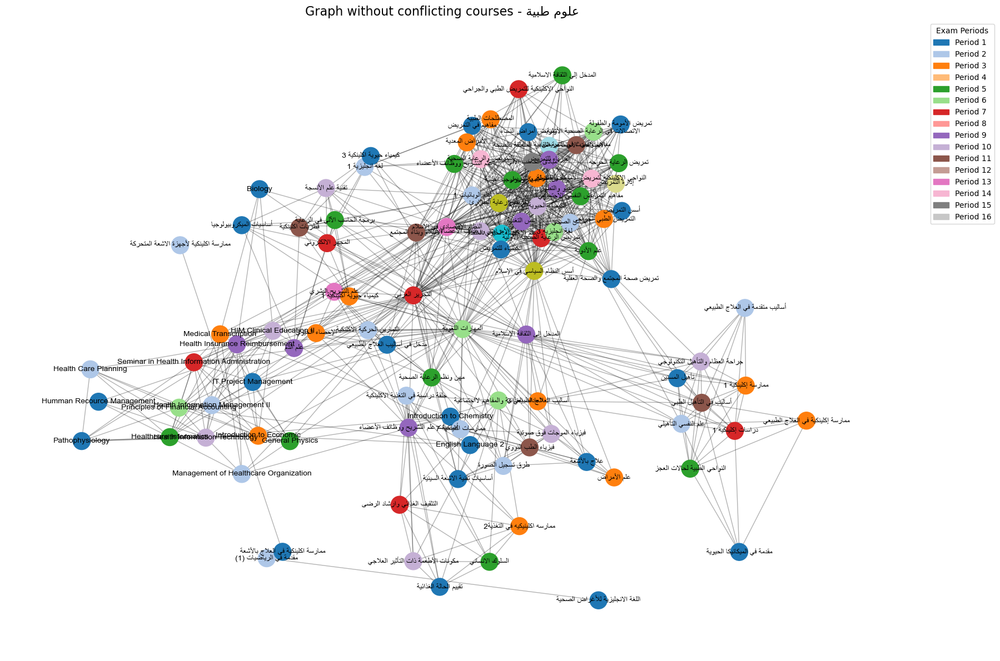

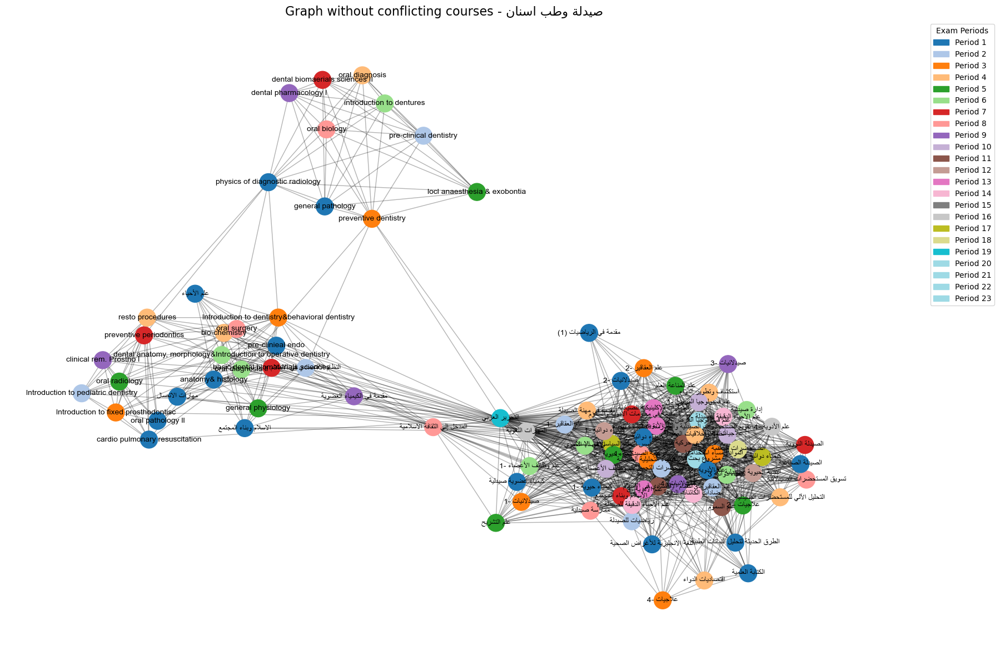

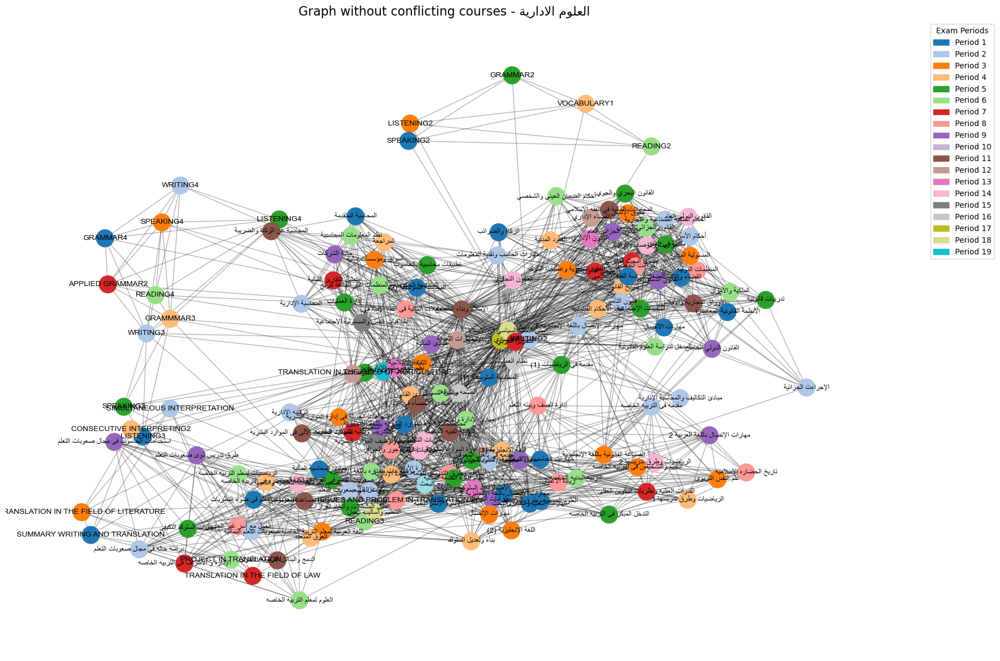

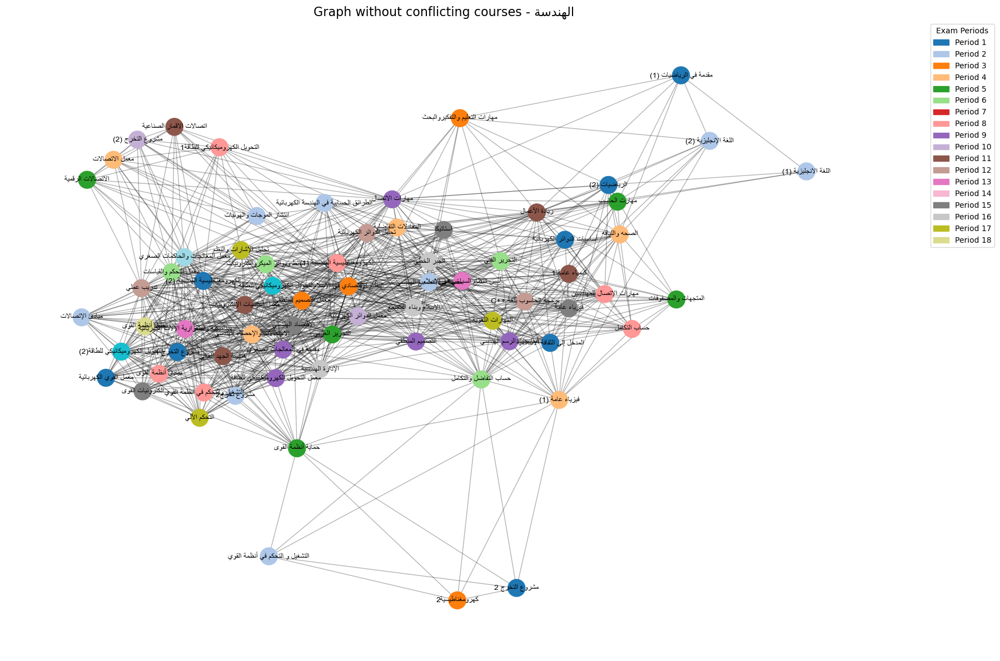

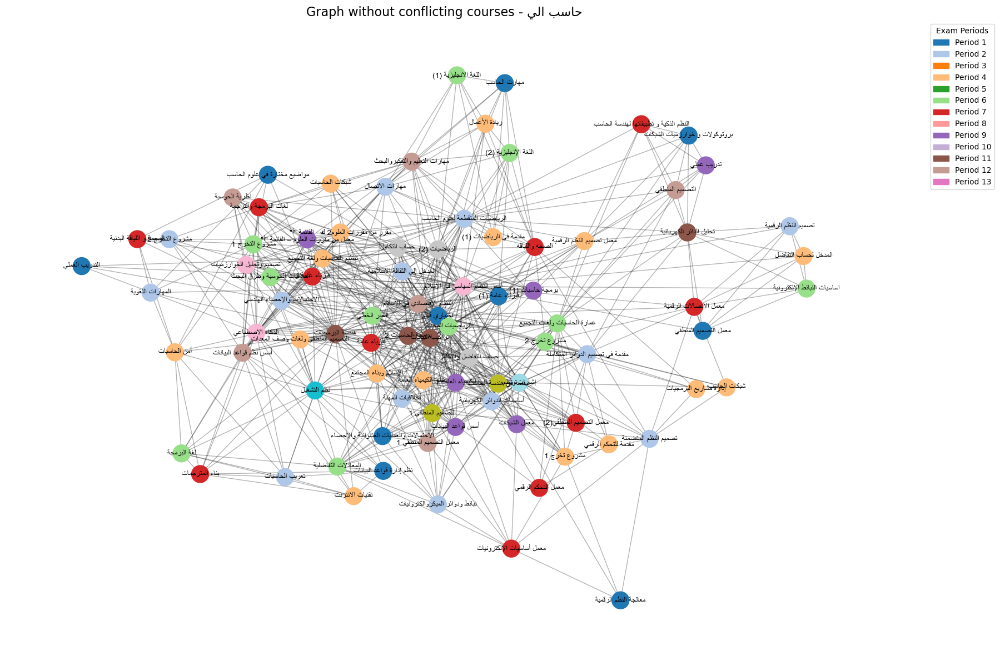

In [60]:
for sheet_name, df in sheets.items():

    student_courses = {}
    for _, row in df.iterrows():
        student_id = row[student_col]
        course = row[course_col]
        student_courses.setdefault(student_id, set()).add(course)

    G = nx.Graph()
    for courses in student_courses.values():
        course_list = list(courses)
        for i in range(len(course_list)):
            for j in range(i + 1, len(course_list)):
                G.add_edge(course_list[i], course_list[j])

    # the algorithm that apply  بتختار العقد (الكورسات) بترتيب عشوائي اسرع واسهل بس النتايج غير دقيقه 
    coloring = nx.coloring.greedy_color(G, strategy="random_sequential") 

    reshaped_labels = {
        node: get_display(arabic_reshaper.reshape(str(node))) for node in G.nodes()
    }

    node_colors = [coloring[node] for node in G.nodes()]

    plt.figure(figsize=(18, 12))
    pos = nx.spring_layout(G, seed=42, k=0.6)

    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.colormaps['tab20'], node_size=500)
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    nx.draw_networkx_labels(G, pos, labels=reshaped_labels, font_family="Arial", font_size=10)


    title = get_display(arabic_reshaper.reshape(f"Graph without conflicting courses - {sheet_name}"))
    plt.title(title, fontsize=16)
    plt.axis('off')

    legend_handles = []
    for period in sorted(set(coloring.values())):
        patch = mpatches.Patch(color=plt.cm.tab20(period), label=f'Period {period + 1}')
        legend_handles.append(patch)

    plt.legend(handles=legend_handles, title="Exam Periods", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [328]:
# هل فعلاً التلوين كان ناجح، يعني تتأكد إن مفيش كورسين (مرتبطين بإيدج) واخدين نفس اللون
conflicts = [
    (x, y) for u, v in G.edges() if coloring[x] == coloring[y]
]

if conflicts:
    print(f"There are contradictions! Their number:{len(conflicts)}")
    for c in conflicts:
        print(f"Conflict between: {c[0]} و {c[1]}")
else:
    print("No conflicts, color is correct.")

No conflicts, color is correct.


<Figure size 1200x600 with 0 Axes>

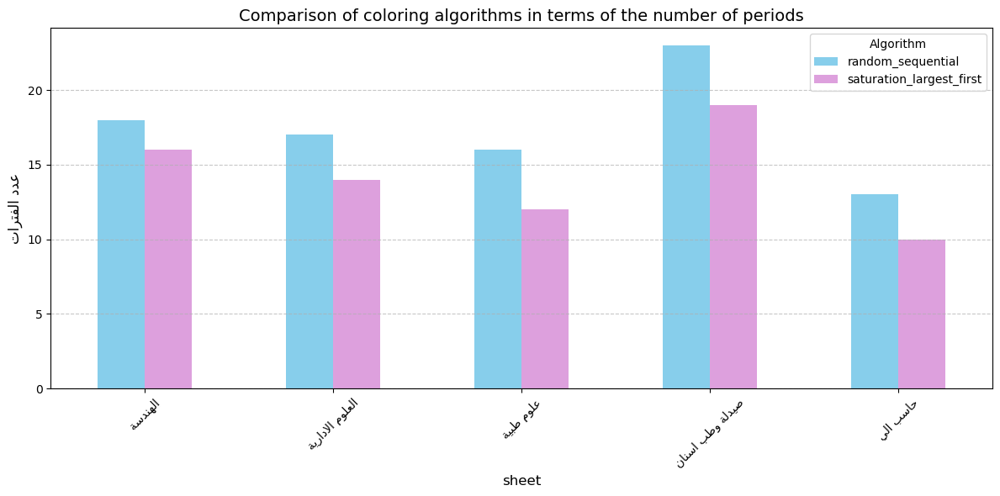

In [63]:
results = [
    {"Sheet": "علوم طبية", "Algorithm": "saturation_largest_first", "Periods": 12},
    {"Sheet": "صيدلة وطب اسنان", "Algorithm": "saturation_largest_first", "Periods": 19},
    {"Sheet": "العلوم الادارية", "Algorithm": "saturation_largest_first", "Periods": 14},
    {"Sheet": "الهندسة", "Algorithm": "saturation_largest_first", "Periods": 16},
    {"Sheet": "حاسب الي", "Algorithm": "saturation_largest_first", "Periods": 10},

    {"Sheet": "علوم طبية", "Algorithm": "random_sequential", "Periods": 16},
    {"Sheet": "صيدلة وطب اسنان", "Algorithm": "random_sequential", "Periods": 23},
    {"Sheet": "العلوم الادارية", "Algorithm": "random_sequential", "Periods": 17},
    {"Sheet": "الهندسة", "Algorithm": "random_sequential", "Periods": 18},
    {"Sheet": "حاسب الي", "Algorithm": "random_sequential", "Periods": 13},

]

def reshape_ar(text):
    return get_display(arabic_reshaper.reshape(text))

for entry in results:
    entry["Sheet"] = reshape_ar(entry["Sheet"])

df = pd.DataFrame(results)
#pivot:  إعادة ترتيب البيانات على شكل جدول جديد
df_pivot = df.pivot(index="Sheet", columns="Algorithm", values="Periods")
df_plot = df_pivot.set_index(df_pivot.index)

plt.figure(figsize=(12, 6))
colors = ['skyblue', 'plum']
df_plot.plot(kind="bar", figsize=(12, 6), color=colors)

plt.title("Comparison of coloring algorithms in terms of the number of periods", fontsize=14)
plt.xlabel("sheet", fontsize=12)
plt.ylabel(reshape_ar("عدد الفترات"), fontsize=12)
plt.xticks(rotation=45)

legend_labels = [reshape_ar(label) for label in df_plot.columns]
plt.legend(title=reshape_ar("Algorithm"), labels=legend_labels)

plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [67]:
output_file = 'output_file.xlsx'

with pd.ExcelWriter(output_file, engine='xlsxwriter') as writer:
    for sheet_name, df in sheets.items():
        if 'رقم الطالب' in df.columns and 'اسم المقرر' in df.columns:
            student_col = 'رقم الطالب'
            course_col = 'اسم المقرر'
        else:
            continue

        df = df.dropna(subset=[student_col, course_col])
        df.loc[:, course_col] = df[course_col].astype(str).apply(reshape_ar)

        # حساب عدد الطلاب في كل كورس
        course_counts = df.groupby(course_col)[student_col].nunique()

        # تجهيز التعارضات بين الكورسات
        student_courses = {}
        for _, row in df.iterrows():
            student = row[student_col]
            course = row[course_col]
            student_courses.setdefault(student, set()).add(course)

        # بناء الجراف
        G = nx.Graph()
        for courses in student_courses.values():
            for c1 in courses:
                for c2 in courses:
                    if c1 != c2:
                        G.add_edge(c1, c2)

        # تلوين الكورسات (تحديد الفترات)
        coloring = nx.coloring.greedy_color(G, strategy="saturation_largest_first")

        # توزيع الفترات على أيام وفترات (صباحي/مسائي)
        exam_schedule = []
        for course, period in sorted(coloring.items(), key=lambda x: x[1]):
            num_students = course_counts.get(course, 0)

            day_number = (period) // 4 + 1  # كل 4 فترات = يوم
            period_in_day = (period) % 4 + 1

            if period_in_day == 1:
                time_label = "صباحي 1"
            elif period_in_day == 2:
                time_label = "صباحي 2"
            elif period_in_day == 3:
                time_label = "مسائي 1"
            else:
                time_label = "مسائي 2"

            final_period = f"اليوم {day_number} - {time_label}"

            exam_schedule.append({
                'اسم الكورس': course,
                'الفترة': final_period,
                'عدد الطلاب': num_students
            })

        exam_schedule_df = pd.DataFrame(exam_schedule)

        if not exam_schedule_df.empty:
            exam_schedule_df.to_excel(writer, sheet_name=f"{sheet_name}_جدول_الامتحانات", index=False)
print(f"Data saved successfully to file: {output_file}")

Data saved successfully to file: output_file.xlsx
